In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option("display.max_columns",None)
pd.set_option('display.max_rows',None)
pd.set_option("display.width",None)

In [2]:
pd.get_option("display.max_columns")

In [3]:
df=pd.read_excel("C:\\Users\\91865\\Desktop\\train_house.xlsx")
house_test=pd.read_excel("C:\\Users\\91865\\Desktop\\test_house.xlsx")

In [4]:
#dataset of Trining values
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [5]:
#dataset of testing values
house_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [6]:
#check the shape of both the dataset
print("Shape of train dataset",df.shape)
print("Shape of test dataset",house_test.shape)

Shape of train dataset (1168, 81)
Shape of test dataset (292, 80)


In [7]:
#top values of traing dataset
df.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [8]:
#top values of testing dataset
house_test.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [9]:
#information abiut the taring and testing dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [10]:
house_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [11]:
#describong the statistics in dataset
df.describe()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1104.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1978.193841,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,24.890704,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [12]:
#statistics of testing dataset
house_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,MiscVal,MoSold,YrSold
count,292.000000,292.000000,247.000000,292.000000,292.000000,292.000000,292.000000,292.000000,291.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,275.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,0.0,292.000000,292.000000,292.000000
mean,755.955479,57.414384,66.425101,10645.143836,6.078767,5.493151,1972.616438,1985.294521,109.171821,439.294521,46.157534,557.315068,1042.767123,1133.691781,339.657534,3.702055,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1979.760000,1.729452,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,NaN,28.184932,6.232877,2007.859589
std,442.565228,43.780649,21.726343,13330.669795,1.356147,1.063267,30.447016,20.105792,175.030021,429.559675,152.467119,411.043768,424.561153,366.941919,424.278825,38.219527,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,23.868875,0.754430,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,NaN,224.036218,2.774556,1.322867
min,6.000000,20.000000,21.000000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,1916.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,1.000000,2006.000000
25%,377.750000,20.000000,53.500000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1964.000000,1.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,4.000000,2007.000000
50%,778.000000,50.000000,65.000000,9200.000000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,0.000000,487.000000,971.000000,1047.500000,0.000000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,1979.000000,2.000000,467.500000,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,6.000000,2008.000000
75%,1152.250000,70.000000,79.000000,11658.750000,7.000000,6.000000,2001.000000,2003.250000,180.000000,700.500000,0.000000,780.000000,1322.000000,1370.500000,717.000000,0.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2003.000000,2.000000,569.750000,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,8.000000,2009.000000
max,1456.000000,190.000000,150.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,1085.000000,1935.000000,3094.000000,2402.000000,1589.000000,479.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,2010.000000,4.000000,1052.000000,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,NaN,3500.000000,12.000000,2010.000000


In [13]:
#checking the null values in 5raining dataset
df.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [14]:
#dropping the columns that have maximum null values in training dataset
df=df.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature','MasVnrType','GarageYrBlt'],axis=1)

In [15]:
#new size of dataset after dropping columns from it
df.shape

(1168, 74)

In [16]:
test_id=house_test['Id']

### Filling the null values in training dataset

In [17]:
#checking the null values in test dataset
house_test.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [18]:
#dropping the columns that have maximum null values in testing dataset
house_test=house_test.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature','MasVnrType','GarageYrBlt'],axis=1)

In [19]:
#again checking the shape of testing dataset
house_test.shape

(292, 73)

#### Filling the null values in training dataset

In [20]:
#now fill the other null values in other columns which have less 
#LotFrontage column
df['LotFrontage'].unique()

array([ nan,  95.,  92., 105.,  58.,  88.,  70.,  80.,  50.,  44., 129.,
        59.,  55.,  64.,  24.,  68.,  71.,  74.,  61.,  60., 120.,  84.,
       141.,  30.,  65.,  76., 100.,  85.,  75., 107., 122.,  82.,  62.,
        73.,  79.,  77.,  41.,  69.,  90.,  96.,  72.,  34.,  78.,  63.,
        40.,  98., 160., 108., 128.,  51.,  81.,  99.,  66.,  37., 174.,
        87.,  53., 152.,  47.,  86.,  56.,  89.,  35.,  52.,  21., 104.,
        57.,  83.,  46., 101., 112., 149.,  93.,  49.,  43., 130.,  54.,
        91.,  67.,  97., 110., 103., 115.,  94.,  48.,  36., 313., 109.,
       144., 121., 102., 116., 182.,  32.,  42., 168., 118.,  38., 140.,
       134., 114., 124.,  39., 111.,  45., 106., 153.])

In [21]:
#mean of the v column
df['LotFrontage'].mean()

70.98846960167715

In [22]:
df['LotFrontage']=df['LotFrontage'].fillna(df['LotFrontage'].mean())

In [23]:
#now check if there are any null vlaues now
df['LotFrontage'].isna().sum()

0

In [24]:
#now MasVnrArea column
#chexk the unique values in MasVnrArea
df['MasVnrArea'].unique()

array([0.000e+00, 4.800e+02, 1.260e+02, 1.800e+02, 6.700e+01, 2.230e+02,
       6.600e+01, 8.200e+01, 1.740e+02, 3.040e+02, 1.720e+02, 1.660e+02,
       1.840e+02, 3.500e+02, 4.120e+02, 1.000e+00, 1.890e+02, 1.120e+02,
       5.000e+01, 2.200e+02, 1.600e+01, 6.300e+02, 2.810e+02, 2.870e+02,
       3.400e+02, 2.160e+02,       nan, 1.400e+02, 1.830e+02, 3.360e+02,
       3.960e+02, 2.320e+02, 3.200e+02, 8.500e+01, 1.620e+02, 1.540e+02,
       1.760e+02, 1.200e+02, 1.080e+02, 2.520e+02, 1.300e+02, 3.510e+02,
       5.710e+02, 5.300e+01, 2.040e+02, 9.750e+02, 6.530e+02, 8.000e+01,
       4.720e+02, 3.400e+01, 1.650e+02, 2.370e+02, 1.130e+02, 9.000e+01,
       1.600e+02, 1.470e+02, 1.360e+02, 3.760e+02, 8.900e+01, 4.150e+02,
       2.000e+02, 5.060e+02, 2.860e+02, 4.500e+01, 2.450e+02, 2.470e+02,
       2.400e+02, 7.000e+01, 9.800e+01, 6.040e+02, 8.600e+02, 2.700e+01,
       1.530e+02, 2.120e+02, 2.060e+02, 7.600e+02, 2.960e+02, 5.280e+02,
       2.990e+02, 3.380e+02, 1.230e+02, 2.330e+02, 

As it holds the continues type of data so we simply fill null values with mean of the column values

In [25]:
#check the mean of the MasVnrArea column
df['MasVnrArea'].mean()

102.31007751937985

In [26]:
#now fill with mean value
df['MasVnrArea']=df['MasVnrArea'].fillna(df['MasVnrArea'].mean())

In [27]:
#again check the null values in MasVnrArea column
df['MasVnrArea'].isna().sum()

0

In [28]:
#now BsmtQual column
#now check the unique values of BsmtQual column
df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [29]:
#check the value count in BsmtQual column
df['BsmtQual'].value_counts()

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

As we have seen the value are in categorical form so we must have fill it with TA of the column as it appears most number of times so the chances are hogh that maximum null values belongs to this value

In [30]:
#filling na values with mode of the column
df['BsmtQual']=df['BsmtQual'].fillna('TA')

In [31]:
#now again check the null values in BsmtQual column
df['BsmtQual'].isna().sum()

0

In [32]:
#now BsmtCond column
#check the null nique values in BsmtCond column
df['BsmtCond'].unique()

array(['TA', 'Gd', 'Fa', nan, 'Po'], dtype=object)

In [33]:
#now check the value counts of BsmtCond column
df['BsmtCond'].value_counts()

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

BsmtCond column also holds categorical value so we will fill it woth the value that occurs maximum number of times in this case 'TA' value occure maximum number of time so we sill fillna with that value because the chnaces belongs to this is higher

In [34]:
#filling null values in BsmtCond column
df['BsmtCond']=df['BsmtCond'].fillna('TA')

In [35]:
#again check the null values if its filled opr not
df['BsmtCond'].isna().sum()

0

In [36]:
#BsmtExposure column
#checkung the unique va;ues in BsmtExposure column
df['BsmtExposure'].unique()

array(['No', 'Gd', 'Av', 'Mn', nan], dtype=object)

In [37]:
# check the value counts in BsmtExposure column
df['BsmtExposure'].value_counts()

No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

BsmtExposure column also holds categorical value so we will fillna with the value that occurs max. number of times

In [38]:
df['BsmtExposure']=df['BsmtExposure'].fillna('No')

In [39]:
#again check the null values in BsmtExposure column
df['BsmtExposure'].isna().sum()

0

In [40]:
#BsmtFinType1 column'
#check the unique value in v col
df['BsmtFinType1'].unique()

array(['ALQ', 'GLQ', 'BLQ', 'Unf', 'Rec', 'LwQ', nan], dtype=object)

In [41]:
#now check the vlaue counts in BsmtFinType1 column
df['BsmtFinType1'].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

BsmtFinType1 column holds categorical value so we fillna with 'Unf' as it occurs max. number times

In [42]:
#filling nan values
df['BsmtFinType1']=df['BsmtFinType1'].fillna('Unf')

In [43]:
# again check the BsmtFinType1 column
df['BsmtFinType1'].isna().sum()

0

In [44]:
#BsmtFinType2 column
#now cheking the unique values in BsmtFinType2 column
df['BsmtFinType2'].unique()

array(['Unf', 'Rec', 'BLQ', 'GLQ', nan, 'ALQ', 'LwQ'], dtype=object)

In [45]:
#check the value counts in BsmtFinType2 column
df['BsmtFinType2'].value_counts()

Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

It also holds categorical value so we will fill it with value appears max. number of times

In [46]:
#filling na values in BsmtFinType2 column
df['BsmtFinType2']=df['BsmtFinType2'].fillna('Unf')

In [47]:
#checking the null values again if its have or not
df['BsmtFinType2'].isna().sum()

0

In [48]:
#Electrical column
#check the unique values in Electrical column
df['Electrical'].unique()

array(['SBrkr', 'FuseA', 'FuseF', 'FuseP', 'Mix'], dtype=object)

In [49]:
#check the value counts in Electrical column
df['Electrical'].value_counts()

SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64

Its all categorical values in v column so we fill the null values with the value that occur max. time in column

In [50]:
#fill the nan values in Electrical column
df['Electrical']=df['Electrical'].fillna('SBrkr')

In [51]:
#again check the values in Electrical column
df['Electrical'].isna().sum()

0

In [52]:
#GarageType column
#check the unique values in v column
df['GarageType'].unique()

array(['Attchd', 'BuiltIn', 'Detchd', 'Basment', nan, '2Types', 'CarPort'],
      dtype=object)

In [53]:
#check the value counts in v column
df['GarageType'].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

as its categorical value in GarageType column so we fill it with the value that occurs the most in GarageType column

In [54]:
df['GarageType']=df['GarageType'].fillna('Attchd')

In [55]:
#again check the null values in GarageType column
df['GarageType'].isna().sum()

0

As we can see the GarageYrBlt column holds the continues values in it so we fill the nan values with the mean of the colkumn

In [56]:
#GarageFinish column
#check the unique values in GarageFinish column
df['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [57]:
#check the value count in GarageFinish column
df['GarageFinish'].value_counts()

Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

GarageFinish column holds categorical data in it so we fill the null values with the valuyes that occurs max. number of time in GarageFinish column

In [58]:
#filling the GarageFinish column null values
df['GarageFinish']=df['GarageFinish'].fillna('Unf')

In [59]:
#checking the null values in GarageFinish column again
df['GarageFinish'].isna().sum()

0

In [60]:
#GarageQual column
#check the unique values in GarageQual columnm
df['GarageQual'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Ex', 'Po'], dtype=object)

In [61]:
#checking the value counts in GarageQual column
df['GarageQual'].value_counts()

TA    1050
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64

fill the null values with the value that occurs max. number of tie in GarageQual column

In [62]:
#filling the null values in GarageQual column
df['GarageQual']=df['GarageQual'].fillna('TA')

In [63]:
#again check the null values in GarageQual column
df['GarageQual'].isna().sum()

0

In [64]:
#GarageCond 
#checking the unique values in GarageCond column
df['GarageCond'].unique()

array(['TA', 'Fa', 'Gd', nan, 'Po', 'Ex'], dtype=object)

In [65]:
#checking the value counts in GarageCond column
df['GarageCond'].value_counts()

TA    1061
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

its a categoriacl column so we have to fill the null values with the value that occur max. time

In [66]:
#filling null vakues in GarageCond column
df['GarageCond']=df['GarageCond'].fillna('TA')

In [67]:
#again checking the null values in GarageCond colimn
df['GarageCond'].isna().sum()

0

### Filling the null values in Testing dataset

In [68]:
#LotFrontage column
#checking the unique values in LotFrontage column
house_test['LotFrontage'].unique()

array([ 86.,  nan,  75.,  21.,  35., 107.,  32.,  60., 100.,  50., 110.,
        70.,  44.,  71.,  52.,  37.,  62.,  78.,  90.,  68.,  67.,  80.,
        76.,  24.,  57.,  30.,  34.,  55.,  79.,  63.,  98.,  36.,  59.,
        66.,  91.,  85.,  64.,  72.,  43.,  74., 102.,  56.,  83.,  77.,
       120.,  73.,  48.,  93.,  92.,  58.,  40.,  33.,  47.,  51., 138.,
       124.,  42.,  89., 105.,  65.,  45.,  61., 137.,  96., 150.,  69.])

There are continuos values in  LotFrontage column which need to be filled with mean of the data values


In [69]:
#filling the null values of LotFrontage column
house_test['LotFrontage']=house_test['LotFrontage'].fillna(house_test['LotFrontage'].mean())

In [70]:
#againg checking the null values in LotFrontage column
house_test['LotFrontage'].isna().sum()

0

In [71]:
#MasVnrArea column
#checking the unique values in MasVnrArea column
house_test['MasVnrArea'].unique()

array([ 200.,    0.,   74.,   80.,  436.,  145.,  320.,  226.,  375.,
        218.,  148.,  196.,  420.,   nan,  387.,  105.,  268.,  473.,
        166.,  340.,  921.,  248.,   44.,  170.,  146.,  180.,  337.,
        541.,  361.,  255.,   16.,  188.,  108.,  650.,  360.,  579.,
        298.,  116.,   32.,  149.,   95.,  318.,   94.,   42.,  328.,
        480.,  240.,  294.,  603., 1031.,  101.,   76.,  359.,  513.,
        106.,  132.,   92.,  284.,  664.,  274.,  378.,  312.,  153.,
        281.,  171.,  219.,  425.,   24.,  368.,  147.,  297.,  530.,
         60.,  207.,  175.,   50.,  169.,  270.,  252.,  183.,  562.,
        584.,   97.,   90.,  632.,  136.,   54.,  293.,  621.,  142.,
        450.,  209.,  120.,  442.,  456.,   72.,  230.,  236.,  266.,
         38.,  162.,  176.,  272.,  468.,  408.])

In [72]:
#filling the null values with the mean of the data values of the column
house_test['MasVnrArea']=house_test['MasVnrArea'].fillna(house_test['MasVnrArea'].mean())

We have filled the null values of the MasVnrArea column with the mean of the column as it has continuos values in it

In [73]:
#BsmtQual column
#check the unique values in BsmtQual column
house_test['BsmtQual'].unique()

array(['Ex', 'Gd', 'TA', nan, 'Fa'], dtype=object)

In [74]:
#check the count values of BsmtQual column
house_test['BsmtQual'].value_counts()

TA    132
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64

In [75]:
#filling the null values with value in BsmtQual column
house_test['BsmtQual']=house_test['BsmtQual'].fillna('TA')

In [76]:
#BsmtCond column
#checking the unique values in BsmtCond column
house_test['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa'], dtype=object)

In [77]:
#filling the missing values in the BsmtCond column
house_test['BsmtCond']=house_test['BsmtCond'].fillna('TA')

We have filled the missing values with the values that occurs max. number of times as it is a categorical values in the column

In [78]:
#BsmtExposure column
#checking the unique values in BsmtExposure column
house_test['BsmtExposure'].unique()

array(['Gd', 'Av', 'No', 'Mn', nan], dtype=object)

In [79]:
#checking the value cpunts in BsmtExposure column
house_test['BsmtExposure'].value_counts()

No    197
Av     41
Gd     26
Mn     21
Name: BsmtExposure, dtype: int64

In [80]:
#filling the values of the BsmtExposure column 
house_test['BsmtExposure']=house_test['BsmtExposure'].fillna('No')

In [81]:
#BsmtFinType1 column
#checking the unique values in BsmtFinType1 column
house_test['BsmtFinType1'].unique()

array(['GLQ', 'Unf', 'Rec', 'BLQ', 'ALQ', nan, 'LwQ'], dtype=object)

In [82]:
#checkin the value counts in BsmtFinType1 cokumn
house_test['BsmtFinType1'].value_counts()

GLQ    88
Unf    85
ALQ    46
BLQ    27
Rec    24
LwQ    15
Name: BsmtFinType1, dtype: int64

In [83]:
#fil the mising values in BsmtFinType1 column
house_test['BsmtFinType1']=house_test['BsmtFinType1'].fillna('GLQ')

In [84]:
#BsmtFinType2
#cheking the null unique values in BsmtFinType2 column
house_test['BsmtFinType2'].unique()

array(['Unf', 'GLQ', 'Rec', 'BLQ', 'LwQ', nan, 'ALQ'], dtype=object)

In [85]:
#checking the value counts in BsmtFinType2 column
house_test['BsmtFinType2'].value_counts()

Unf    254
Rec     11
BLQ      9
LwQ      6
ALQ      3
GLQ      2
Name: BsmtFinType2, dtype: int64

In [86]:
#filling the missing values
house_test['BsmtFinType2']=house_test['BsmtFinType2'].fillna('Unf')

In [87]:
#Electrical column
#checing the unique values in Electrical column
house_test['Electrical'].unique()

array(['SBrkr', 'FuseA', 'FuseP', nan, 'FuseF'], dtype=object)

In [88]:
#checking the value v\counts in Electrical column
house_test['Electrical'].value_counts()

SBrkr    264
FuseA     20
FuseF      6
FuseP      1
Name: Electrical, dtype: int64

In [89]:
#filling the missing values in Electrical column
house_test['Electrical']=house_test['Electrical'].fillna('SBrkr')

In [90]:
#GarageType column
#check the unioaue values in GarageType column
house_test['GarageType'].unique()

array(['Attchd', 'BuiltIn', nan, 'Basment', 'Detchd', '2Types', 'CarPort'],
      dtype=object)

In [91]:
#checking the value counts in GarageType column
house_test['GarageType'].value_counts()

Attchd     179
Detchd      73
BuiltIn     18
Basment      3
2Types       1
CarPort      1
Name: GarageType, dtype: int64

In [92]:
#fillimg the missing values in GarageType column
house_test['GarageType']=house_test['GarageType'].fillna('Attchd')

In [93]:
#GarageFinish column
house_test['GarageFinish'].unique()

array(['Fin', 'RFn', 'Unf', nan], dtype=object)

In [94]:
#check the value count of GarageFinish column
house_test['GarageFinish'].value_counts()

Unf    118
RFn     83
Fin     74
Name: GarageFinish, dtype: int64

In [95]:
#filling the missing values in GarageFinish column
house_test['GarageFinish']=house_test['GarageFinish'].fillna('Unf')

In [96]:
#GarageQual column
#check the unique values in GarageQual column
house_test['GarageQual'].unique()

array(['TA', nan, 'Fa', 'Gd', 'Po', 'Ex'], dtype=object)

In [97]:
#check the value counts of GarageQual column
house_test['GarageQual'].value_counts()

TA    261
Fa      9
Gd      3
Po      1
Ex      1
Name: GarageQual, dtype: int64

In [98]:
#fillimg the missing values of GarageQual column
house_test['GarageQual']=house_test['GarageQual'].fillna('TA')

In [99]:
#GarageCond column
#checking the unique values in GarageCond column
house_test['GarageCond'].unique()

array(['TA', nan, 'Fa', 'Po', 'Ex', 'Gd'], dtype=object)

In [100]:
#check the value counts in GarageCond column
house_test['GarageCond'].value_counts()

TA    265
Fa      7
Po      1
Ex      1
Gd      1
Name: GarageCond, dtype: int64

In [101]:
#fill the missing values in GarageCond column
house_test['GarageCond']=house_test['GarageCond'].fillna('TA')

In [102]:
for col in df:
    print(df[col].unique())

[127 889 793 ... 196  31 617]
[120  20  60  50  70  30 160  85  45  90  40  80 190  75 180]
['RL' 'RM' 'FV' 'RH' 'C (all)']
[ 70.9884696  95.         92.        105.         58.         88.
  70.         80.         50.         44.        129.         59.
  55.         64.         24.         68.         71.         74.
  61.         60.        120.         84.        141.         30.
  65.         76.        100.         85.         75.        107.
 122.         82.         62.         73.         79.         77.
  41.         69.         90.         96.         72.         34.
  78.         63.         40.         98.        160.        108.
 128.         51.         81.         99.         66.         37.
 174.         87.         53.        152.         47.         86.
  56.         89.         35.         52.         21.        104.
  57.         83.         46.        101.        112.        149.
  93.         49.         43.        130.         54.         91.
  67.         97. 

In [103]:
for col in house_test:
    print(house_test[col].unique())

[ 337 1018  929 1148 1227  650 1453  152  427  776   30 1425  423 1185
  775  391 1408  513 1266  173 1150  797  137  706 1377 1177 1456  369
 1421  999 1217  937  769  831  678  574  921 1292 1277  676  108  424
  823 1455  377 1256 1120  265 1158  725 1378 1139  122  515  518 1214
  443  903   53  469   76 1142 1222  851  334 1008   19  339 1118  834
 1176  945 1415  911  388  747  620  386  818  539  535 1399  571   38
  850 1032 1433 1354 1072  371 1242  681  290  973  989  484 1240 1125
 1143 1340 1343  936 1151 1380 1190  635   47  729 1434  472 1156 1352
  717  385 1334  243   39 1168  214  647  490  512 1181 1451 1428  767
 1250  855 1001   49   25 1058   24  758 1060 1110 1057  491  378 1429
   55  770  737   59   29  788    9 1371  260  249   88  893  803  901
 1124  223 1278 1174  312  624 1445  296  753 1320  432 1362 1069 1255
   50  454  881  500  807  766  866  162 1193  798 1400    6   58 1435
  867  960  441  481  219  128  858  215 1030 1204  531  529  346  621
 1194 

In [104]:
df=df.drop(columns=['Utilities','Id'])

In [105]:
house_test=house_test.drop(columns=['Utilities','Id'])


In [106]:
#new size of the bith the datasets
print("New size of Training Dataset\n",df.shape)
print("New size of Testing Dataset\n",house_test.shape)

New size of Training Dataset
 (1168, 72)
New size of Testing Dataset
 (292, 71)


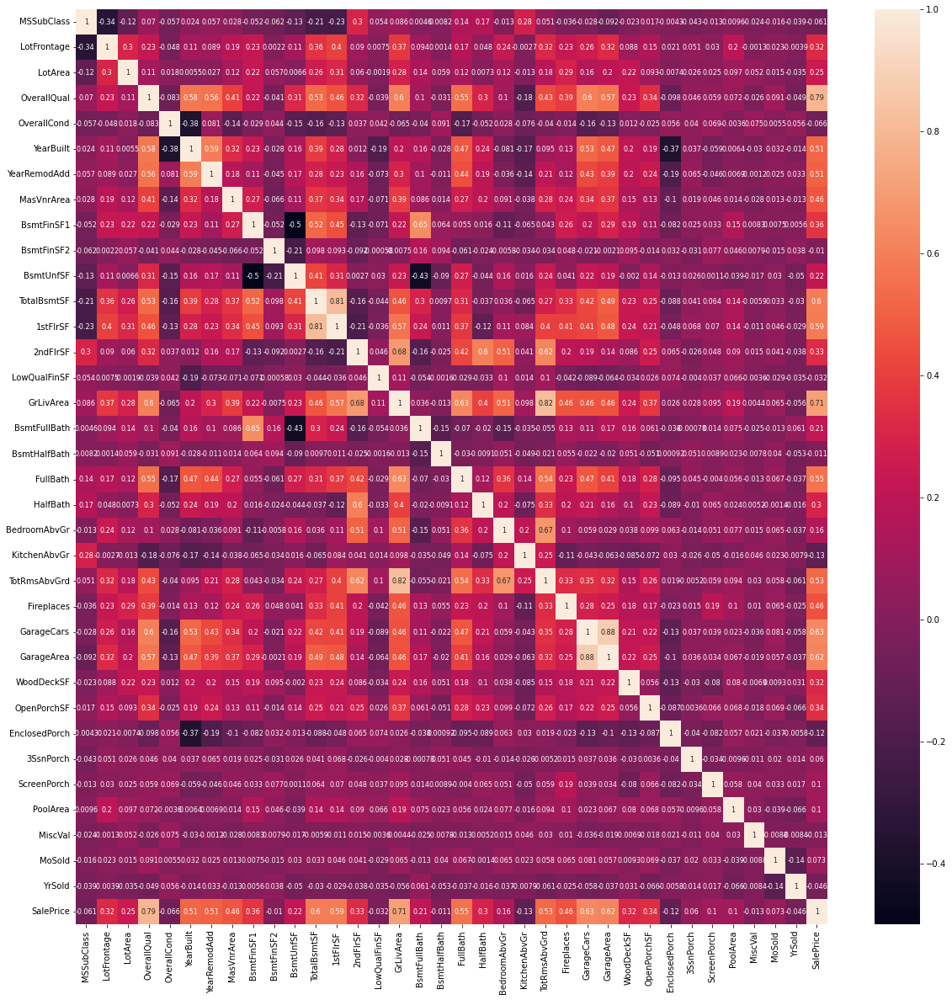

In [107]:
#check the correlation between columns in training dataset
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,annot_kws={"size":8})
plt.show()

In [108]:
df=df.drop(columns=['TotRmsAbvGrd','GarageCars','TotalBsmtSF','PoolArea'])

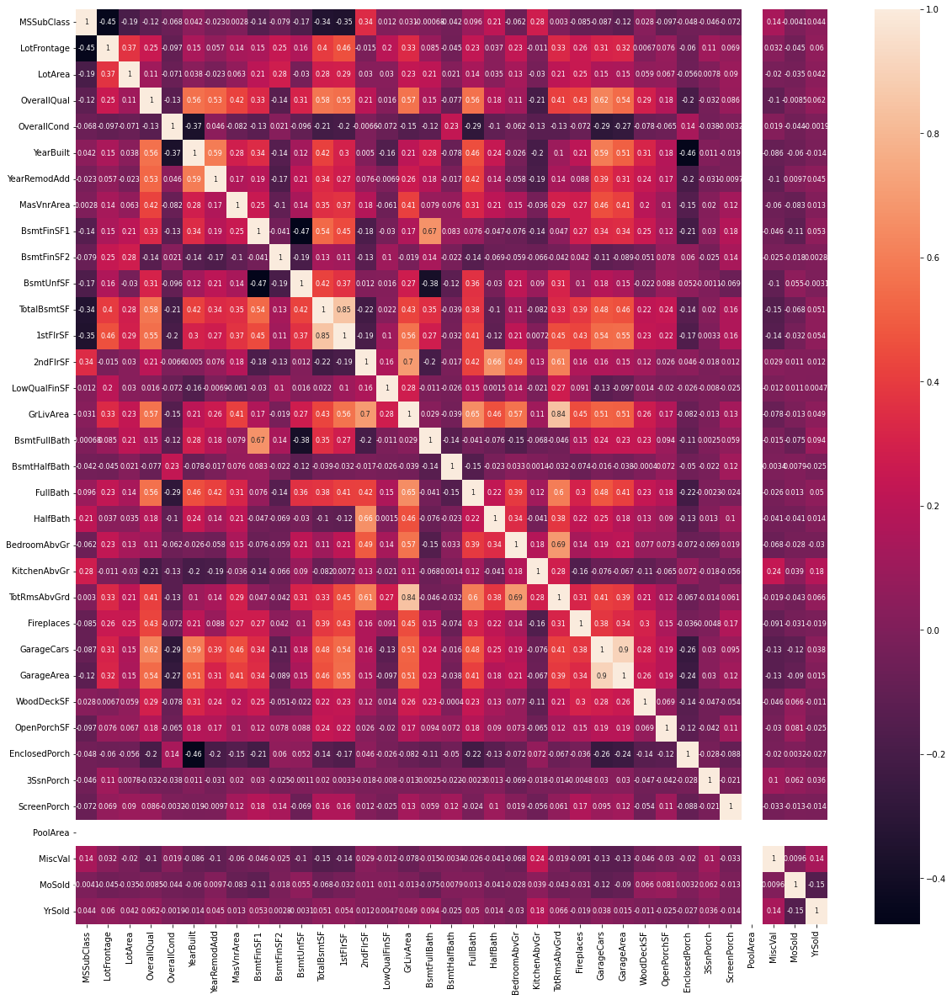

In [109]:
#check the correlation between columns in testing dataset
plt.figure(figsize=(20,20))
sns.heatmap(house_test.corr(),annot=True,annot_kws={"size":8})
plt.show()

In [110]:
#Dropping column which are correlated to another column
house_test=house_test.drop(columns=['TotRmsAbvGrd','GarageCars','TotalBsmtSF','PoolArea'])

In [111]:
#new size of the bith the datasets
print("New size of Training Dataset\n",df.shape)
print("New size of Testing Dataset\n",house_test.shape)

New size of Training Dataset
 (1168, 68)
New size of Testing Dataset
 (292, 67)


In [112]:
#changing categorical values in integer for machine learning interpretation
def encoder(df):
    column=list(df.select_dtypes(include=['category','object']))  # we have taken aobject which will have a list of columns having category or object datatype
    le=LabelEncoder()                                             #instantiatinf Label Encoder()
    for feature in column:
        try:
            df[feature]=le.fit_transform(df[feature])
        except:
            print("Error code",feature)
    return df

In [113]:
#changing categorical values in integer for machine learning interpretation of training dataset
def encoder(df):
    column=list(df.select_dtypes(include=['category','object']))  # we have taken aobject which will have a list of columns having category or object datatype
    le=LabelEncoder()                                             #instantiatinf Label Encoder()
    for feature in column:
        try:
            df[feature]=le.fit_transform(df[feature])
        except:
            print("Error code",feature)
    return df

In [114]:
df=encoder(df)
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,3,70.98847,4928,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,0.000000,3,4,1,2,3,3,0,120,5,0,958,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,6,1,1,1,440,4,4,2,0,205,0,0,0,0,2,2007,8,4,128000
1,20,3,95.00000,15865,1,0,3,4,1,12,2,2,0,2,8,6,1970,1970,0,5,12,13,0.000000,2,2,2,3,1,1,0,351,4,823,1043,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,6,1,1,2,621,4,4,2,81,207,0,0,224,0,10,2007,8,4,268000
2,60,3,92.00000,9920,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,0.000000,2,4,2,2,3,0,2,862,5,0,255,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,6,1,1,2,455,4,4,2,180,130,0,0,0,0,6,2007,8,4,269790
3,20,3,105.00000,11751,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,480.000000,3,4,1,2,3,3,1,705,5,0,1139,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,6,1,1,1,546,4,4,2,0,122,0,0,0,0,1,2010,0,4,190000
4,20,3,70.98847,16635,1,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,126.000000,2,4,1,2,3,3,0,1246,5,0,356,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,6,1,1,0,529,4,4,2,240,0,0,0,0,0,6,2009,8,4,215000
5,60,3,58.00000,14054,1,0,3,4,0,8,2,2,0,5,7,5,2006,2006,1,1,11,12,0.000000,2,4,2,2,3,0,5,0,5,0,879,1,0,1,4,879,984,0,1863,0,0,2,1,4,1,2,6,1,3,0,660,4,4,2,100,17,0,0,0,0,11,2006,6,5,219210
6,20,3,70.98847,11341,1,0,3,4,0,19,2,2,0,2,5,6,1957,1996,3,1,12,13,180.000000,3,4,1,2,3,3,0,1302,5,0,90,1,4,1,4,1392,0,0,1392,1,0,1,1,3,1,3,4,1,5,2,528,4,4,2,0,0,0,0,95,0,5,2010,8,4,121500
7,20,3,88.00000,13125,1,3,3,0,0,19,2,2,0,2,5,4,1957,2000,1,1,12,13,67.000000,3,4,1,3,3,3,4,168,1,682,284,1,0,1,4,1803,0,0,1803,1,0,2,0,3,1,3,0,1,1,1,484,4,4,2,0,0,0,0,0,0,1,2006,8,4,155000
8,20,3,70.00000,9170,1,3,3,0,0,7,1,2,0,2,5,7,1965,1965,3,1,7,7,0.000000,3,4,1,3,3,3,0,698,2,96,420,1,0,1,4,1214,0,0,1214,1,0,1,0,2,1,3,6,0,5,2,461,1,1,2,0,0,184,0,0,400,4,2007,8,4,140000
9,50,3,80.00000,8480,1,3,3,4,0,12,2,2,0,0,5,5,1947,1950,1,1,7,7,0.000000,3,4,1,3,3,3,4,442,5,0,390,1,4,1,4,832,384,0,1216,0,0,1,0,2,1,3,6,0,5,2,336,4,4,2,158,0,102,0,0,0,10,2008,0,0,118500


In [115]:
#changing categorical values in integer for machine learning interpretation of testing dataset
def encoder(house_test):
    column=list(house_test.select_dtypes(include=['category','object']))  # we have taken aobject which will have a list of columns having category or object datatype
    le=LabelEncoder()                                             #instantiatinf Label Encoder()
    for feature in column:
        try:
            house_test[feature]=le.fit_transform(house_test[feature])
        except:
            print("Error code",feature)
    return df

In [116]:
house_test=encoder(house_test)
house_test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,3,70.98847,4928,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,0.000000,3,4,1,2,3,3,0,120,5,0,958,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,6,1,1,1,440,4,4,2,0,205,0,0,0,0,2,2007,8,4,128000
1,20,3,95.00000,15865,1,0,3,4,1,12,2,2,0,2,8,6,1970,1970,0,5,12,13,0.000000,2,2,2,3,1,1,0,351,4,823,1043,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,6,1,1,2,621,4,4,2,81,207,0,0,224,0,10,2007,8,4,268000
2,60,3,92.00000,9920,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,0.000000,2,4,2,2,3,0,2,862,5,0,255,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,6,1,1,2,455,4,4,2,180,130,0,0,0,0,6,2007,8,4,269790
3,20,3,105.00000,11751,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,480.000000,3,4,1,2,3,3,1,705,5,0,1139,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,6,1,1,1,546,4,4,2,0,122,0,0,0,0,1,2010,0,4,190000
4,20,3,70.98847,16635,1,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,126.000000,2,4,1,2,3,3,0,1246,5,0,356,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,6,1,1,0,529,4,4,2,240,0,0,0,0,0,6,2009,8,4,215000
5,60,3,58.00000,14054,1,0,3,4,0,8,2,2,0,5,7,5,2006,2006,1,1,11,12,0.000000,2,4,2,2,3,0,5,0,5,0,879,1,0,1,4,879,984,0,1863,0,0,2,1,4,1,2,6,1,3,0,660,4,4,2,100,17,0,0,0,0,11,2006,6,5,219210
6,20,3,70.98847,11341,1,0,3,4,0,19,2,2,0,2,5,6,1957,1996,3,1,12,13,180.000000,3,4,1,2,3,3,0,1302,5,0,90,1,4,1,4,1392,0,0,1392,1,0,1,1,3,1,3,4,1,5,2,528,4,4,2,0,0,0,0,95,0,5,2010,8,4,121500
7,20,3,88.00000,13125,1,3,3,0,0,19,2,2,0,2,5,4,1957,2000,1,1,12,13,67.000000,3,4,1,3,3,3,4,168,1,682,284,1,0,1,4,1803,0,0,1803,1,0,2,0,3,1,3,0,1,1,1,484,4,4,2,0,0,0,0,0,0,1,2006,8,4,155000
8,20,3,70.00000,9170,1,3,3,0,0,7,1,2,0,2,5,7,1965,1965,3,1,7,7,0.000000,3,4,1,3,3,3,0,698,2,96,420,1,0,1,4,1214,0,0,1214,1,0,1,0,2,1,3,6,0,5,2,461,1,1,2,0,0,184,0,0,400,4,2007,8,4,140000
9,50,3,80.00000,8480,1,3,3,4,0,12,2,2,0,0,5,5,1947,1950,1,1,7,7,0.000000,3,4,1,3,3,3,4,442,5,0,390,1,4,1,4,832,384,0,1216,0,0,1,0,2,1,3,6,0,5,2,336,4,4,2,158,0,102,0,0,0,10,2008,0,0,118500


We have changes all the categorical values of the dataset into int datatype by using Label Encoder

#### data Distribution and outliers detection of Trianing dataset

C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91865\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

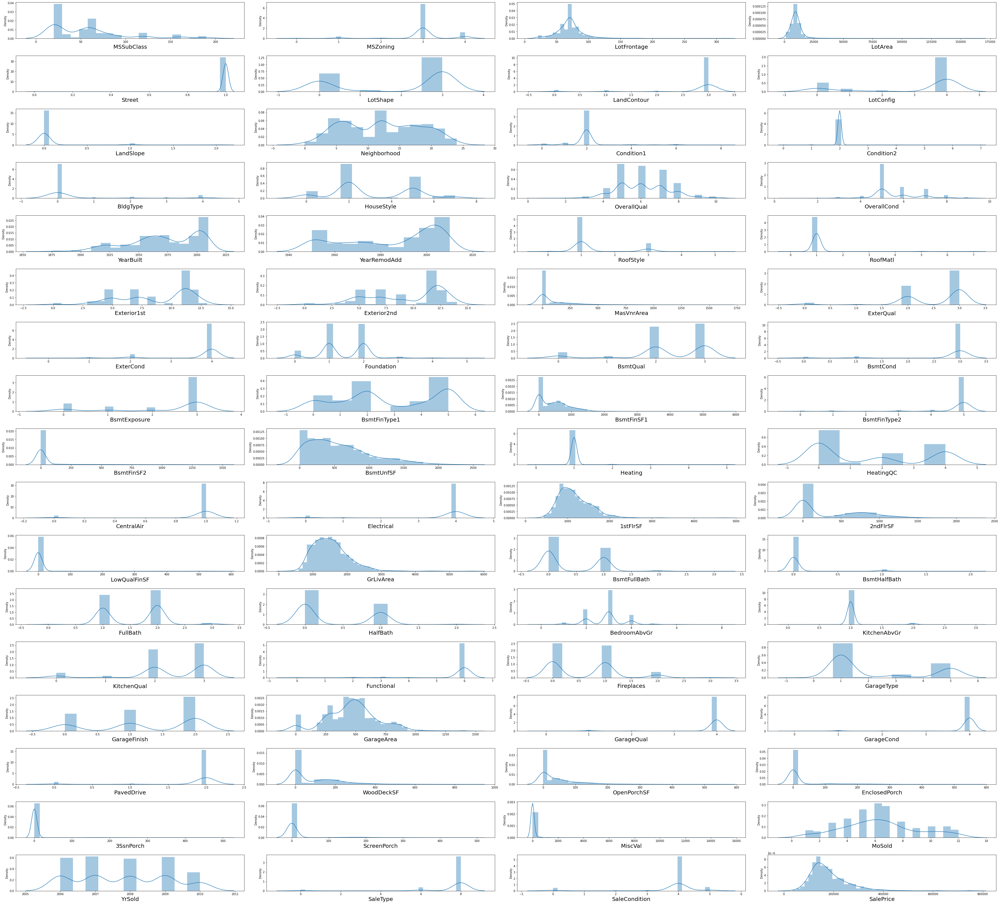

In [117]:
#lets check the data distribution for every column
plt.figure(figsize=(50,50))
plotnumber=1
for column in df:
    if plotnumber<=76:
        ax=plt.subplot(19,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [118]:
#to check the skewness of data
df.skew()

MSSubClass        1.422019
MSZoning         -1.796785
LotFrontage       2.710383
LotArea          10.659285
Street          -17.021969
LotShape         -0.603775
LandContour      -3.125982
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.612816
Exterior2nd      -0.592349
MasVnrArea        2.834658
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -1.343781
BsmtCond         -3.293554
BsmtExposure     -1.166987
BsmtFinType1     -0.068901
BsmtFinSF1        1.871606
BsmtFinType2     -3.615783
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
Heating          10.103609
HeatingQC         0.449933
CentralAir       -3.475188
E

MSSubClass          AxesSubplot(0.125,0.846593;0.168478x0.0334071)
MSZoning         AxesSubplot(0.327174,0.846593;0.168478x0.0334071)
LotFrontage      AxesSubplot(0.529348,0.846593;0.168478x0.0334071)
LotArea          AxesSubplot(0.731522,0.846593;0.168478x0.0334071)
Street              AxesSubplot(0.125,0.806504;0.168478x0.0334071)
LotShape         AxesSubplot(0.327174,0.806504;0.168478x0.0334071)
LandContour      AxesSubplot(0.529348,0.806504;0.168478x0.0334071)
LotConfig        AxesSubplot(0.731522,0.806504;0.168478x0.0334071)
LandSlope           AxesSubplot(0.125,0.766416;0.168478x0.0334071)
Neighborhood     AxesSubplot(0.327174,0.766416;0.168478x0.0334071)
Condition1       AxesSubplot(0.529348,0.766416;0.168478x0.0334071)
Condition2       AxesSubplot(0.731522,0.766416;0.168478x0.0334071)
BldgType            AxesSubplot(0.125,0.726327;0.168478x0.0334071)
HouseStyle       AxesSubplot(0.327174,0.726327;0.168478x0.0334071)
OverallQual      AxesSubplot(0.529348,0.726327;0.168478x0.0334

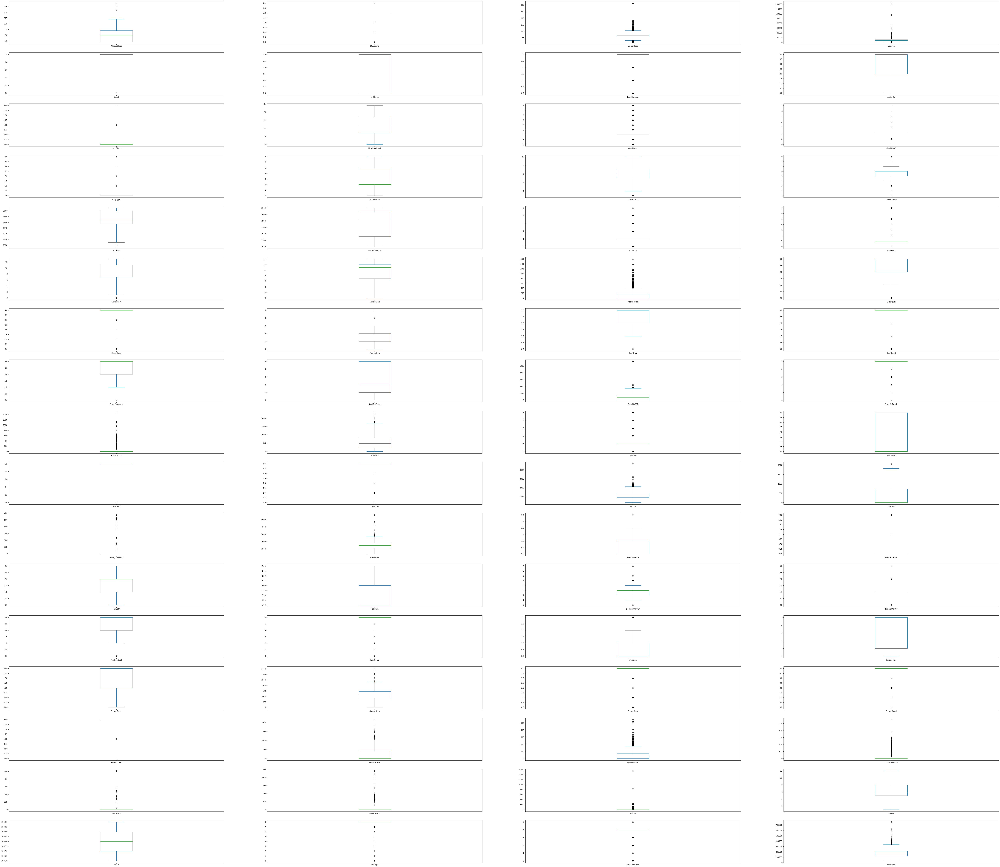

In [119]:
#checking outliers using boxplot
df.plot(kind="box", subplots=True, layout=(19,4), figsize=(100,100))

Still there are outliers but we nees to first find out correlation

In [120]:
import statsmodels.api as sma
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [121]:
df.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.007478,-0.336681,-0.124151,-0.035981,0.104485,-0.021387,0.076880,-0.014930,0.013918,-0.042474,-0.044319,0.731815,0.381585,0.070462,-0.056978,0.023988,0.056618,-0.100641,-0.032214,-0.090178,-0.120022,0.027813,-0.024133,0.004186,0.053951,-0.052242,-0.013220,-0.068192,0.017515,-0.052236,0.040573,-0.062403,-0.134170,0.047734,-0.001994,-0.113883,0.045533,-0.227927,0.300366,0.053737,0.086448,0.004556,0.008207,0.140807,0.168423,-0.013283,0.283506,-0.011378,0.022913,-0.035792,0.077469,-0.000067,-0.092408,-0.010568,-0.025595,-0.068702,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,-0.023503,-0.016015,-0.038595,0.035050,-0.028981,-0.060775
MSZoning,0.007478,1.000000,-0.069661,-0.023328,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,-0.299732,-0.174586,0.000913,0.009719,-0.012037,0.005548,-0.063862,0.184815,-0.099269,-0.244844,0.123822,0.002336,0.037414,0.021518,-0.034161,-0.031322,0.027055,-0.032638,0.051188,0.119852,-0.015887,-0.079205,-0.033095,-0.048968,0.012098,-0.064125,-0.007287,0.006345,-0.188837,-0.121209,-0.001906,0.026744,0.111689,-0.091684,0.010658,0.125155,0.162566,-0.168364,-0.168881,-0.087375,-0.077280,-0.004509,-0.152694,0.111221,0.004409,0.030793,0.003416,-0.051646,-0.004964,0.079854,0.004501,-0.133221
LotFrontage,-0.336681,-0.069661,1.000000,0.299452,-0.035309,-0.144523,-0.073451,-0.192468,0.046051,0.065824,-0.025581,0.011761,-0.403220,0.056321,0.229218,-0.047573,0.112655,0.088799,0.146222,0.082566,0.087727,0.110762,0.188758,-0.169835,0.044582,0.090734,-0.176402,0.043165,-0.123896,-0.031507,0.228996,-0.007509,0.002159,0.113924,-0.026622,-0.078262,0.077404,0.066868,0.403436,0.089675,0.007506,0.374251,0.094046,0.001389,0.171773,0.047816,0.237199,-0.002729,-0.174713,0.039272,0.230610,-0.216237,-0.192961,0.322644,0.041522,0.043699,0.092551,0.088334,0.151328,0.020902,0.051084,0.030405,-0.001329,0.022517,-0.003885,-0.035356,0.065091,0.323779
LotArea,-0.124151,-0.023328,0.299452,1.000000,-0.263973,-0.189201,-0.159038,-0.152063,0.395410,0.010707,0.029520,0.040096,-0.215345,-0.040637,0.107188,0.017513,0.005506,0.027228,0.038615,0.194142,0.048265,0.027328,0.121086,-0.057865,0.011438,-0.021195,-0.075262,0.010165,-0.136900,-0.053584,0.221851,-0.084713,0.056656,0.006600,-0.020394,-0.003337,0.051182,0.050388,0.312843,0.059803,-0.001915,0.281360,0.142387,0.059282,0.123197,0.007271,0.117351,-0.013075,-0.064278,-0.033165,0.285983,-0.123746,-0.117373,0.195162,0.005999,0.035657,0.021907,0.216720,0.093080,-0.007446,0.025794,0.025256,0.051679,0.015141,-0.035399,0.005421,0.034236,0.249499
Street,-0.035981,0.140215,-0.035309,-0.263973,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,0.020292,0.057866,-0.006875,0.007889,0.012482,0.014618,0.024583,0.044509,0.017738,0.032701,-0.031959,-0.017190,0.065253,-0.006420,-0.009066,0.045208,0.003550,0.024205,0.006981,-0.047968,0.043024,0.038720,0.011486,0.040957,0.007352,0.043322,-0.036483,0.013788,0.033208,0.045146,0.027587,0.012304,-0.012056,-0.015309,0.010574,-0.000824,-0.001178,-0.025537,-0.012622,-0.010973,0.041318,-0.033142,0.029649,0.021360,0.007338,0.016026,-0.030354,-0.008860,-0.019635,0.025920,0.014176,0.044753
LotShape,0.104

In [122]:
#df.columns

In [123]:
#df=df.drop(columns=['Utilities'])

In [124]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'Functional',
       'Fireplaces', 'GarageType', 'GarageFinish', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'MoSold',
       'YrSold', 'SaleType

In [125]:
#dividing label and feature to for insights
x=df.drop(columns=['SalePrice'])
y=df['SalePrice']

In [126]:
print(x)
print(y)

      MSSubClass  MSZoning  LotFrontage  LotArea  Street  LotShape  \
0            120         3     70.98847     4928       1         0   
1             20         3     95.00000    15865       1         0   
2             60         3     92.00000     9920       1         0   
3             20         3    105.00000    11751       1         0   
4             20         3     70.98847    16635       1         0   
5             60         3     58.00000    14054       1         0   
6             20         3     70.98847    11341       1         0   
7             20         3     88.00000    13125       1         3   
8             20         3     70.00000     9170       1         3   
9             50         3     80.00000     8480       1         3   
10            50         4     50.00000     8600       1         3   
11            60         3     44.00000     9548       1         0   
12            20         3    129.00000     9196       1         0   
13            20    

In [127]:
df['SalePrice']

0       128000
1       268000
2       269790
3       190000
4       215000
5       219210
6       121500
7       155000
8       140000
9       118500
10      119500
11      237000
12      201000
13      126500
14      135500
15      165000
16      120500
17      194500
18      148000
19      106000
20      231500
21      133000
22      142125
23      136500
24      146000
25      217000
26      112000
27      394432
28      113000
29      188700
30      319900
31      135000
32      190000
33      128500
34      169000
35      122000
36      152000
37      243000
38      156000
39       79500
40      215000
41      132000
42      144152
43      130000
44      149900
45      124500
46      179000
47      147000
48       39300
49      155000
50      312500
51      256000
52       60000
53      153000
54       84900
55      230000
56      180000
57      190000
58      106500
59      239000
60      107500
61      123000
62      176000
63      228500
64      117500
65      350000
66      13

In [128]:
print('Shape of Features',x.shape)
print('Shape of Label',y.shape)

Shape of Features (1168, 67)
Shape of Label (1168,)


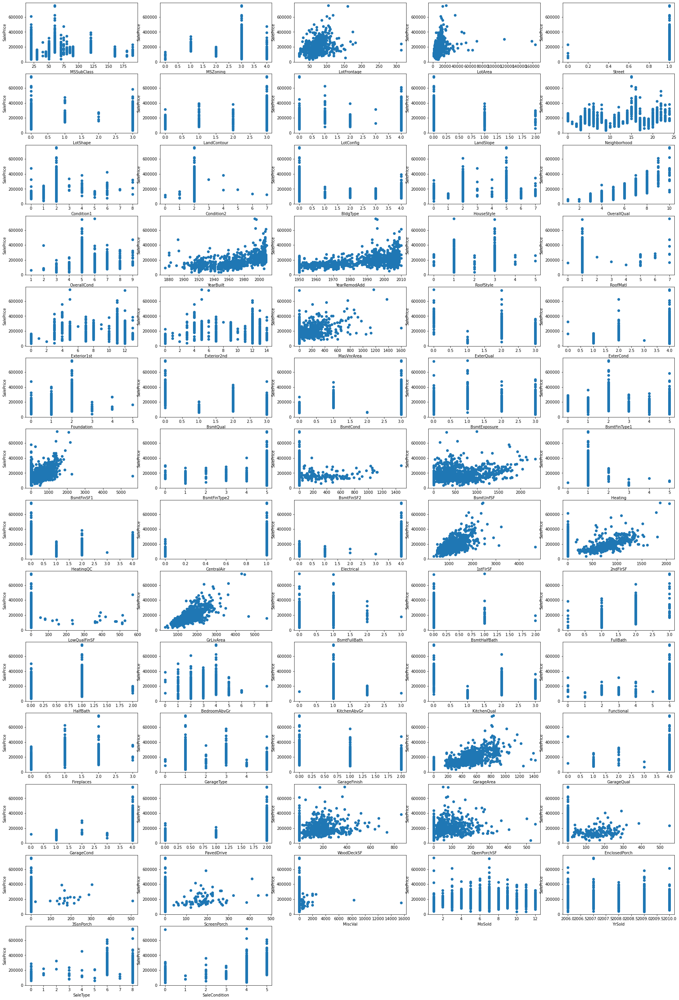

In [129]:

#check the relationship between labels and features
plt.figure(figsize=(30,50))
plotnumber=1
for column in x:
    if plotnumber<=75:
        ax=plt.subplot(15,5,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column)
        plt.ylabel("SalePrice")
    plotnumber+=1
plt.show()

In [130]:
from sklearn.preprocessing import StandardScaler

In [131]:
#data scling
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)

In [132]:
x_scaled

array([[ 1.50830058, -0.02164599,  0.        , ..., -0.60548713,
         0.33003329,  0.20793187],
       [-0.87704243, -0.02164599,  1.07063136, ..., -0.60548713,
         0.33003329,  0.20793187],
       [ 0.07709478, -0.02164599,  0.93686671, ..., -0.60548713,
         0.33003329,  0.20793187],
       ...,
       [ 2.46243779, -0.02164599, -2.09513215, ...,  0.8992128 ,
         0.33003329,  0.20793187],
       [ 0.31562908, -4.76211672, -0.93583847, ...,  0.14686284,
         0.33003329,  0.20793187],
       [ 0.07709478, -0.02164599,  0.        , ..., -1.3578371 ,
         0.33003329,  0.20793187]])

In [133]:
from sklearn.model_selection import train_test_split

In [134]:
#dividing features and labels into x and y
x_train=x
y_train=y

In [135]:
#y_train.head()
house_test=house_test.drop(columns=['SalePrice'])


In [136]:
from sklearn.linear_model import LinearRegression

In [137]:
lr=LinearRegression()
lr.fit(x_train,y_train)

LinearRegression()

In [138]:
#predicting saleprice of testin`g dataset
x_test=house_test
y_test=lr.predict(x_test)
print(y_test)
y_test

[120196.82658728 296437.24783488 240951.34581317 ... 149489.77664394
  64512.86478285 198789.5635488 ]


array([120196.82658728, 296437.24783488, 240951.34581317, ...,
       149489.77664394,  64512.86478285, 198789.5635488 ])

In [139]:
#lets check how model fits the train dadta
lr.score(x_train,y_train)

0.8320288123497244

In [140]:
#lets check how model fits the test data
lr.score(x_test,y_test)

1.0

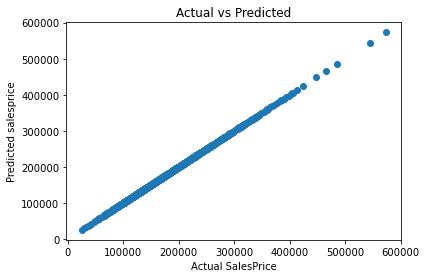

In [141]:
#lets plot and visulaize
plt.scatter(y_test,y_test)
plt.xlabel("Actual SalesPrice")
plt.ylabel("Predicted salesprice")
plt.title("Actual vs Predicted")
plt.show()

In [142]:
# predict the chance of sakesprice through the features
#print("Predict the sales price for the house":lr.predict(scaler.transform[[70,0,50.00000,8500,1,3,3,4,0,9,1,2,0,5,4,4,1920,1950,2,1,3,3,2,0.0,3,1,0,3,3,3,5,0,5,0,649,649,1,4,0,4,649,668,0,1317,0,0,1,0,3,1,3,6,6,0,5,1920.0,2,1,250,4,1,0,0,54,172,0,0,0,0,7,2008,8,4]]))

In [143]:
df.tail(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1166,70,0,50.00000,8500,1,3,3,4,0,9,1,2,0,5,4,4,1920,1950,2,1,3,3,0.0,3,1,0,3,3,3,5,0,5,0,649,1,4,0,4,649,668,0,1317,0,0,1,0,3,1,3,6,0,5,2,250,4,1,0,0,54,172,0,0,0,7,2008,8,4,40000
1167,60,3,70.98847,7861,1,0,3,4,0,8,2,2,0,5,6,5,2002,2003,1,1,11,12,0.0,2,4,2,2,3,3,2,457,5,0,326,1,0,1,4,807,702,0,1509,1,0,2,1,3,1,2,6,1,1,0,393,4,4,2,100,75,0,0,0,0,6,2006,8,4,183200


#### 2ndmodel training(Decision Tree model)

In [144]:
from sklearn.tree import DecisionTreeRegressor

In [145]:
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [146]:
#predicting saleprice of testin`g dataset
x_test=house_test
y_dt=dt.predict(x_test)
print(y_dt)


[128000. 268000. 269790. ... 148500.  40000. 183200.]


In [147]:
dt.score(x_train,y_train)

1.0

In [148]:
dt.score(x_test,y_test)

0.7981185445058069

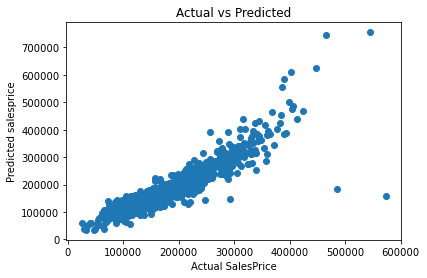

In [149]:
#lets plot and visulaize
plt.scatter(y_test,y_dt)
plt.xlabel("Actual SalesPrice")
plt.ylabel("Predicted salesprice")
plt.title("Actual vs Predicted")
plt.show()

#### Random forest Model

In [150]:
from sklearn.ensemble import RandomForestRegressor

In [151]:
rf=RandomForestRegressor()
rf.fit(x_train,y_train)

RandomForestRegressor()

In [152]:
#predicting saleprice of testin`g dataset
x_test=house_test
y_rf=rf.predict(x_test)
print(y_rf)

[130874.83 282209.33 252962.61 ... 150461.    63106.43 182955.3 ]


In [153]:
rf.score(x_train,y_train)

0.9814277916239212

In [154]:
rf.score(x_test,y_test)

0.8761448109621586

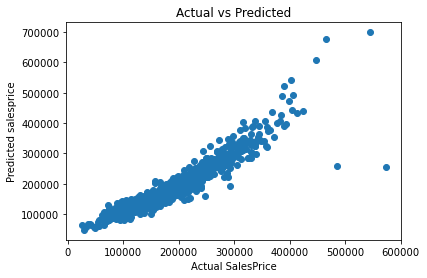

In [155]:
#lets plot and visulaize
plt.scatter(y_test,y_rf)
plt.xlabel("Actual SalesPrice")
plt.ylabel("Predicted salesprice")
plt.title("Actual vs Predicted")
plt.show()

### Hyperparameter tuning of random forest regressor model

In [156]:
n_estimators=[10,500]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_split=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]

In [157]:
#create the random grid
param_grid={'n_estimators':n_estimators,
           'max_features':max_features,
           'max_depth':max_depth,
           'min_samples_split':min_samples_split,
           'min_samples_leaf':min_samples_leaf,
           'bootstrap':bootstrap}
print(param_grid)

{'n_estimators': [10, 500], 'max_features': ['auto', 'sqrt'], 'max_depth': [2, 4], 'min_samples_split': [2, 4], 'min_samples_leaf': [1, 2], 'bootstrap': [True, False]}


In [158]:
from sklearn.model_selection import GridSearchCV
rf_grid=GridSearchCV(estimator=rf,param_grid=param_grid,cv=3,verbose=2,n_jobs=4)

In [159]:
rf_grid.fit(x_train,y_train)

Fitting 3 folds for each of 64 candidates, totalling 192 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=4,
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4],
                         'n_estimators': [10, 500]},
             verbose=2)

In [160]:
rf_grid.best_params_

{'bootstrap': True,
 'max_depth': 4,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 500}

In [161]:
rf_grid.score(x_train,y_train)

0.8667695817615306

In [162]:
rf_grid.score(x_test,y_rf)

0.9288155691118953

In [163]:
import pickle

In [164]:
filename = 'finalized_model.pkl'
pickle.dump(rf_grid, open(filename, 'wb'))

After testing with three different models 
1. Linear regression
2. decision tree Regressor
3. Random Forest regressor

Random Forest Regressor gives the best moel accuracy neither underfitting nor overfitting beacuse we have done gridsearch cv with cross validation now the values with id of the data

In [176]:
testing_values=pd.DataFrame({'Sale price':y_rf})
testing_values

,Sale price
0,130874.83
1,282209.33
2,252962.61
3,194376.00
4,212914.72
5,217038.63
6,139814.32
7,159339.55
8,139932.00
9,116535.56
